<a href="https://colab.research.google.com/github/EsdFatima/textile-defect-detection-using-object-detection-algorithms/blob/main/4_defects__mask_rcnn.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Mounting Google Drive
from google.colab import drive
drive.mount("/content/drive")


Mounted at /content/drive


In [ ]:
!nvidia-smi

Tue Jun  6 17:14:29 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   35C    P8     9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
!python -m pip install pyyaml==5.1
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities.
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

# Properly install detectron2. (Please do not install twice in both ways)
# !python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 9.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyyaml: filename=PyYAML-5.1-cp310-cp310-linux_x86_64.whl size=44090 sha256=7b6e844e8243ad659691c73c371fbc097b85d61503f729d315159380b3913894
  Stored in directory: /root/.cache/pip/wheels/70/83/31/975b737609aba39a4099d471d5684141c1fdc3404f97e7f68a
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 6.0
    Uninstalling PyYAML-6.0:
      Successfully uninstalled PyYAML-6.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dask 2022.12.1 requires pyyaml>=5.3.1, but you have pyyaml 5.1 which is incompatible.
flax 0.6.9 requires PyYAML>=5.4.1, but you have pyyaml 5.1 which is incompatibl

In [ ]:
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())

2.0.1+cu118 True


# **Instance Segmentation**

In [ ]:
"""
You can use this package to convert labelme annotations to COCO format.
https://github.com/fcakyon/labelme2coco
"""
#!pip install labelme2coco
!pip install labelme2coco==0.1.2

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# import package
import labelme2coco

# set directory that contains labelme annotations and image files
labelme_folder_train = "/content/drive/MyDrive/fourdefects_mrcnn/Fourdefects/train/"
labelme_folder_test  = "/content/drive/MyDrive/fourdefects_mrcnn/Fourdefects/test/"
# set path for coco json to be saved
save_json_path_train = "/content/drive/MyDrive/fourdefects_mrcnn/Fourdefects/train/train_coco.json"
save_json_path_test  = "/content/drive/MyDrive/fourdefects_mrcnn/Fourdefects/test/test_coco.json"
# convert labelme annotations to coco
# convert labelme annotations to coco
labelme2coco.convert(labelme_folder_train, save_json_path_train)
labelme2coco.convert(labelme_folder_test, save_json_path_test)


print("Done...")

Done...


In [ ]:
# if your dataset is in COCO format, this cell can be replaced by the following three lines:
# from detectron2.data.datasets import register_coco_instances
# register_coco_instances("my_dataset_train", {}, "json_annotation_train.json", "path/to/image/dir")
# register_coco_instances("my_dataset_val", {}, "json_annotation_val.json", "path/to/image/dir")

# Register Custom Detectron2 Data
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "/content/drive/MyDrive/fourdefects_mrcnn/Fourdefects/train/train_coco.json", "/content/drive/MyDrive/fourdefects_mrcnn/Fourdefects/train")
register_coco_instances("my_dataset_test", {},  "/content/drive/MyDrive/fourdefects_mrcnn/Fourdefects/test/test_coco.json", "/content/drive/MyDrive/fourdefects_mrcnn/Fourdefects/test")


print("Done...")


Done...


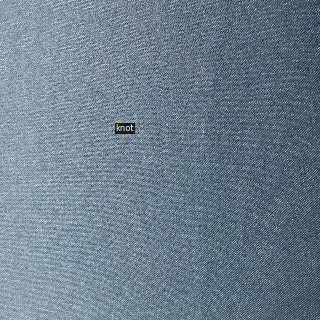

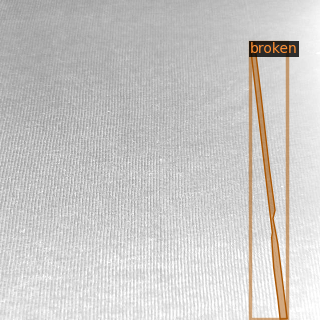

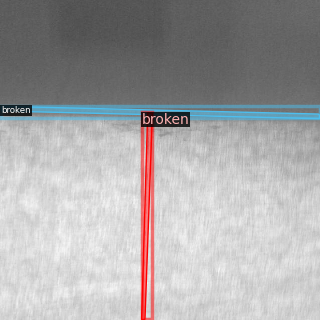

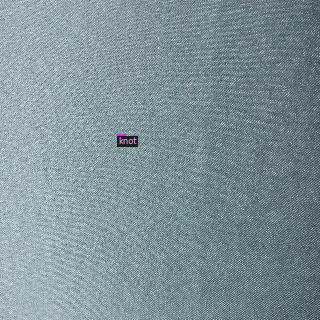

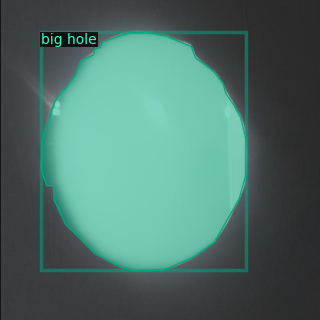

In [ ]:

# visualize training data
from detectron2.data import MetadataCatalog, DatasetCatalog
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")
import random
from detectron2.utils.visualizer import Visualizer
import cv2
from google.colab.patches import cv2_imshow
for d in random.sample(dataset_dicts, 5):
    img = cv2.imread(d["file_name"])
    #cv2_imshow(img)
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])
    print("\n")

In [ ]:
# Train the model
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os
from detectron2 import model_zoo

# mask_rcnn

model_link = "COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml"

# Detectron2.config package
# https://detectron2.readthedocs.io/modules/config.html

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file(model_link))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(model_link)
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 600
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 4

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False )
trainer.train()

[05/10 13:50:14 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
model_final_a3ec72.pkl: 254MB [00:01, 211MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[05/10 13:50:15 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[05/10 13:50:32 d2.utils.events]:  eta: 0:04:11  iter: 19  total_loss: 2.733  loss_cls: 1.381  loss_box_reg: 0.31  loss_mask: 0.6941  loss_rpn_cls: 0.3189  loss_rpn_loc: 0.04924    time: 0.4309  last_time: 0.4498  data_time: 0.0268  last_data_time: 0.0170   lr: 8.1588e-06  max_mem: 2413M
[05/10 13:50:47 d2.utils.events]:  eta: 0:04:03  iter: 39  total_loss: 2.328  loss_cls: 1.043  loss_box_reg: 0.333  loss_mask: 0.6873  loss_rpn_cls: 0.1105  loss_rpn_loc: 0.0306    time: 0.4896  last_time: 0.4361  data_time: 0.0088  last_data_time: 0.0181   lr: 1.6484e-05  max_mem: 2413M
[05/10 13:50:55 d2.utils.events]:  eta: 0:03:55  iter: 59  total_loss: 1.966  loss_cls: 0.6137  loss_box_reg: 0.2539  loss_mask: 0.6822  loss_rpn_cls: 0.1625  loss_rpn_loc: 0.05219    time: 0.4710  last_time: 0.4420  data_time: 0.0114  last_data_time: 0.0048   lr: 2.4809e-05  max_mem: 2415M
[05/10 13:51:04 d2.utils.events]:  eta: 0:03:46  iter: 79  total_loss: 1.51  loss_cls: 0.3666  loss_box_reg: 0.3262  loss_mask: 0.

In [ ]:
# Test evaluation
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.engine import DefaultPredictor
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.50
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("my_dataset_test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "my_dataset_test")
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [04/02 20:39:11 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[04/02 20:39:12 d2.data.datasets.coco]: Loaded 8 images in COCO format from /content/drive/MyDrive/fourdefects_mrcnn/Fourdefects/test/test_coco.json
[04/02 20:39:12 d2.data.build]: Distribution of instances among all 4 categories:
|  category  | #instances   |  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|:----------:|:-------------|
|  big hole  | 2            |   broken   | 2            | small hole | 2            |
|    knot    | 2            |            |              |            |              |
|   total    | 8            |            |              |            |              |
[04/02 20:39:12 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='

OrderedDict([('bbox',
              {'AP': 53.08443344334434,
               'AP50': 91.74917491749174,
               'AP75': 48.06105610561056,
               'APs': nan,
               'APm': nan,
               'APl': 56.652227722772274,
               'AP-big hole': 85.04950495049505,
               'AP-broken': 41.039603960396036,
               'AP-small hole': 55.049504950495056,
               'AP-knot': 31.199119911991197}),
             ('segm',
              {'AP': 53.230198019801975,
               'AP50': 87.62376237623762,
               'AP75': 50.24752475247525,
               'APs': nan,
               'APm': nan,
               'APl': 53.86138613861387,
               'AP-big hole': 95.04950495049505,
               'AP-broken': 30.297029702970296,
               'AP-small hole': 55.049504950495056,
               'AP-knot': 32.524752475247524})])

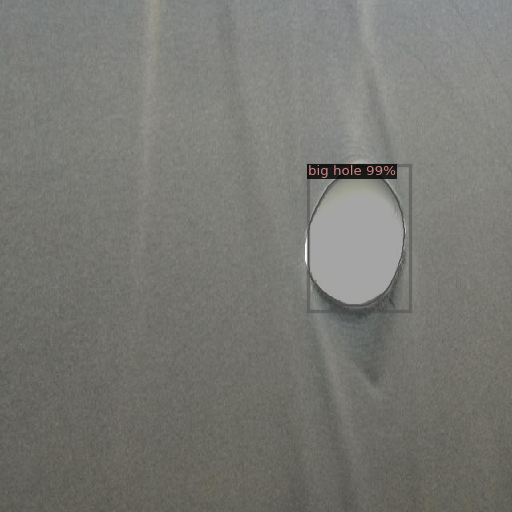

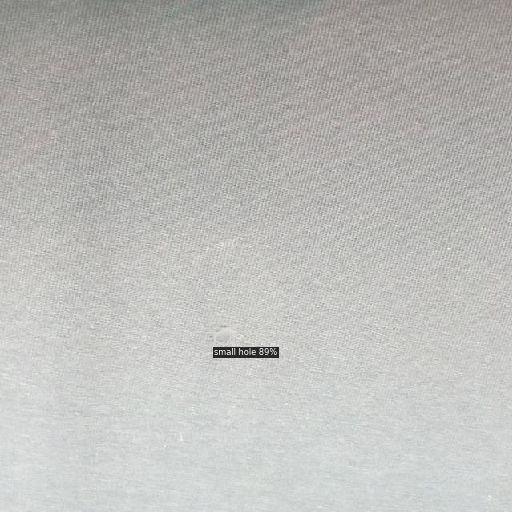

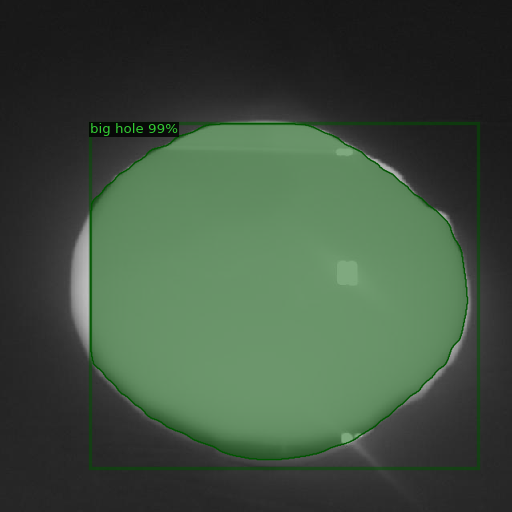

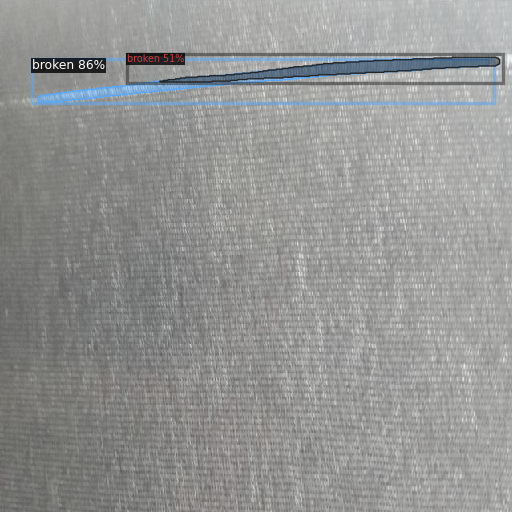

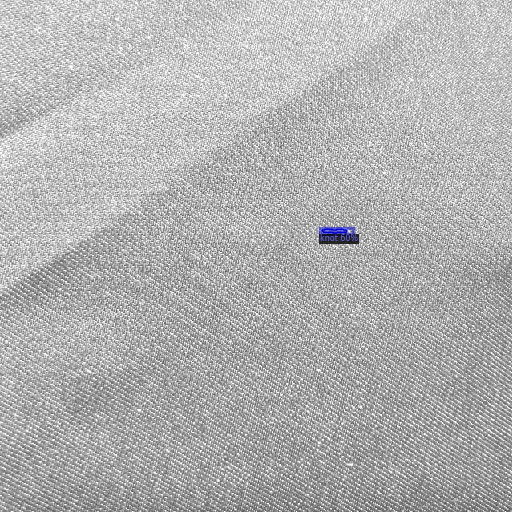

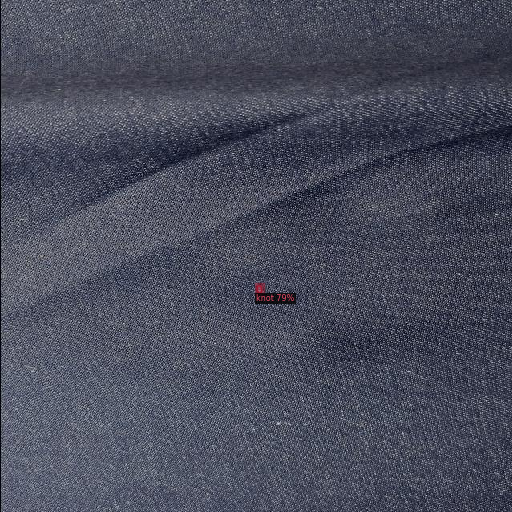

In [ ]:
# Inference & evaluation using the trained model
# cfg already contains everything we've set previously. Now we changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.DATASETS.TEST = ("my_dataset_test", )
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set the testing threshold for this model
predictor = DefaultPredictor(cfg)
test_metadata = MetadataCatalog.get("my_dataset_test")


from detectron2.utils.visualizer import ColorMode
import glob

for imageName in glob.glob("/content/drive/MyDrive/fourdefects_mrcnn/Fourdefects/test/*jpg"):
  im = cv2.imread(imageName)
  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata,
                scale=0.8
                 )
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])
  print("\n")

In [ ]:
# Save model_final.pth
%cp /content/output/model_final.pth   /content/drive/MyDrive/fourdefects_mrcnn/Fourdefects

# **Using Saved Model**

In [ ]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

# Mounting Google Drive
from google.colab import drive

Classes : 
 tensor([0], device='cuda:0')
Scores : 
 tensor([0.9864], device='cuda:0')


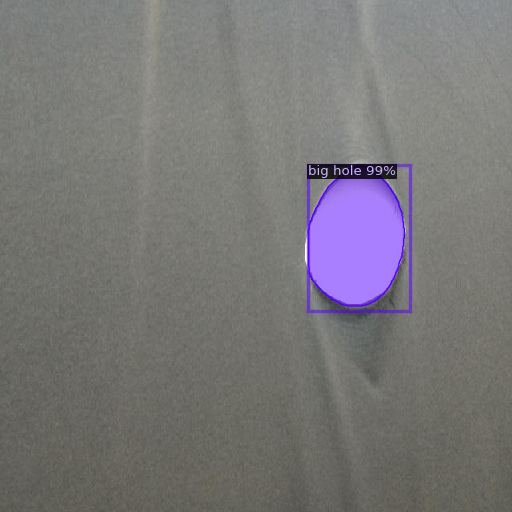



Classes : 
 tensor([2], device='cuda:0')
Scores : 
 tensor([0.8898], device='cuda:0')


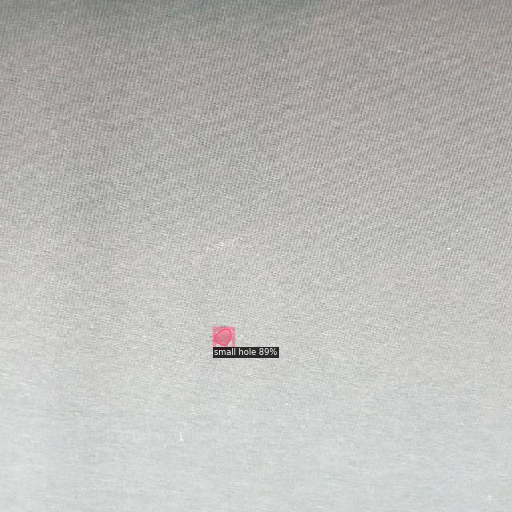



Classes : 
 tensor([0], device='cuda:0')
Scores : 
 tensor([0.9913], device='cuda:0')


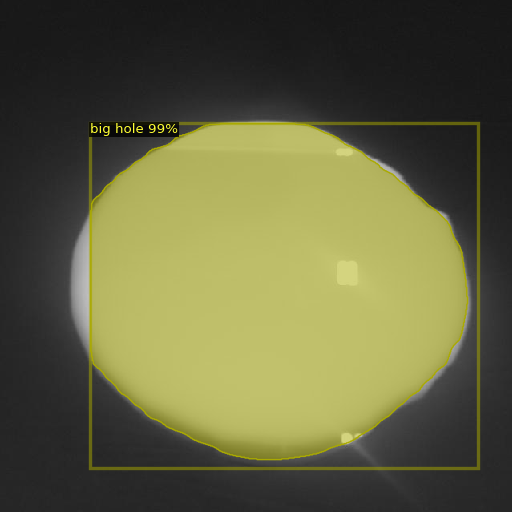



Classes : 
 tensor([1, 1], device='cuda:0')
Scores : 
 tensor([0.8582, 0.5135], device='cuda:0')


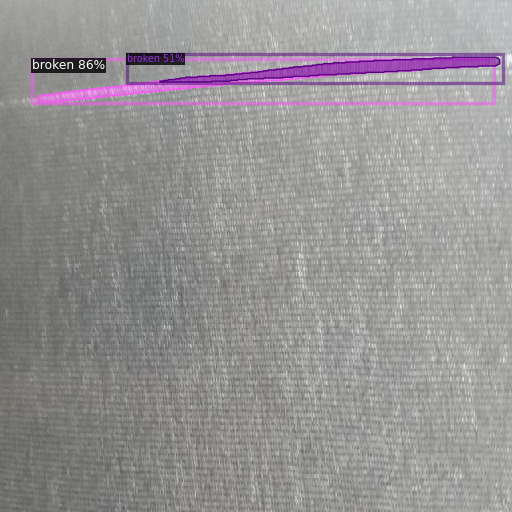



Classes : 
 tensor([3], device='cuda:0')
Scores : 
 tensor([0.5994], device='cuda:0')


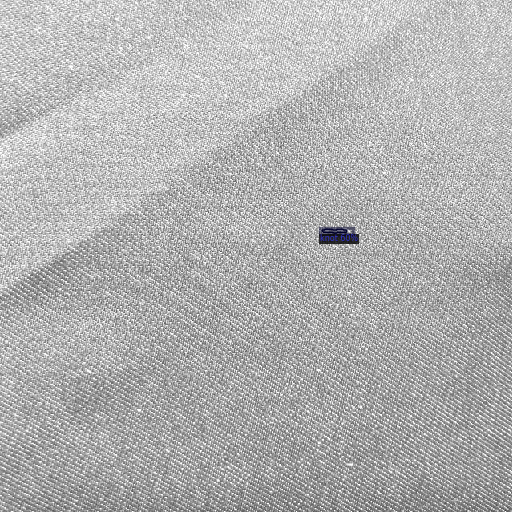



Classes : 
 tensor([3], device='cuda:0')
Scores : 
 tensor([0.7869], device='cuda:0')


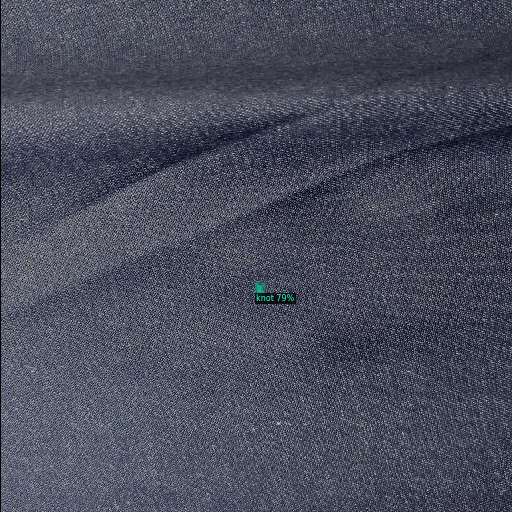

In [ ]:
# Using saved model
my_cfg = get_cfg()
my_cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml"))
my_cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5 # Set threshold for this model
my_cfg.MODEL.WEIGHTS = "/content/drive/MyDrive/fourdefects_mrcnn/Fourdefects/model_final.pth"
my_cfg.MODEL.ROI_HEADS.NUM_CLASSES = 4
my_model_detectron2 = DefaultPredictor(my_cfg)


from detectron2.utils.visualizer import ColorMode
import glob

for imageName in glob.glob("/content/drive/MyDrive/fourdefects_mrcnn/Fourdefects/test/*jpg"):
  im = cv2.imread(imageName)
  outputs = my_model_detectron2(im)
  print("Classes : \n", outputs["instances"].pred_classes)
  print("Scores : \n", outputs["instances"].scores)

  v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata,
                scale=0.8
                 )
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])
  print("\n")

In [ ]:
from detectron2.config import get_cfg
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml")) #Yapılandırma Dosyası
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.001
cfg.SOLVER.GAMMA = 0.05
cfg.SOLVER.STEPS = [500]
cfg.TEST.EVAL_PERIOD = 200
cfg.SOLVER.MAX_ITER = 2000
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 4
cfg.MODEL.WEIGHTS = "/content/output/model_final.pth"
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.58



cfg.merge_from_list(["MODEL.WEIGHTS", "weights.pth"])   # can also load values from a list of str
print(cfg.dump())  # print formatted configs
with open("output.yaml", "w") as f:
  f.write(cfg.dump())   # save config to file

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [ ]:
%cd /content/drive/MyDrive/fourdefects_mrcnn/Fourdefects

/content/drive/MyDrive/fourdefects_mrcnn/Fourdefects


In [ ]:
!pip install unet

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
